# Importing libraries

In [1]:
# for data loading
import numpy as np
import pandas as pd
import json

# for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# using cufflinks for plotly visualization
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# set plotly & cufflinks in offline mode
init_notebook_mode(connected=True)
cf.go_offline(connected=True)
cf.set_config_file(theme='pearl')

# Load the data

In [2]:
# loading the data, since the data have time series column. I will load the data with parse_date
df = pd.read_csv('dataset_for_analyst_assignment_20201120.csv',
                 parse_dates=['REGISTRATION_DATE', 'FIRST_PURCHASE_DAY', 'LAST_PURCHASE_DAY'])

In [4]:
df.head()

,REGISTRATION_DATE,REGISTRATION_COUNTRY,PURCHASE_COUNT,PURCHASE_COUNT_DELIVERY,PURCHASE_COUNT_TAKEAWAY,FIRST_PURCHASE_DAY,LAST_PURCHASE_DAY,USER_ID,BREAKFAST_PURCHASES,LUNCH_PURCHASES,...,WEB_PURCHASES,ANDROID_PURCHASES,PREFERRED_RESTAURANT_TYPES,USER_HAS_VALID_PAYMENT_METHOD,MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE,MOST_COMMON_WEEKDAY_TO_PURCHASE,AVG_DAYS_BETWEEN_PURCHASES,MEDIAN_DAYS_BETWEEN_PURCHASES,AVERAGE_DELIVERY_DISTANCE_KMS,PURCHASE_COUNT_BY_STORE_TYPE
0,2019-09-01,DNK,0,NaN,NaN,NaT,NaT,1,NaN,NaN,...,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,"{\n ""General merchandise"": 0,\n ""Grocery"": 0..."
1,2019-09-01,FIN,1,1.0,0.0,2020-09-02,2020-09-02,2,0.0,1.0,...,0.0,1.0,NaN,False,23.0,2.0,NaN,NaN,6.853,"{\n ""General merchandise"": 0,\n ""Grocery"": 0..."
2,2019-09-01,DNK,19,19.0,0.0,2019-12-10,2020-05-25,3,0.0,4.0,...,19.0,0.0,NaN,True,21.0,2.0,9.0,3.0,6.559,"{\n ""General merchandise"": 1,\n ""Grocery"": 9..."
3,2019-09-01,FIN,0,NaN,NaN,NaT,NaT,4,NaN,NaN,...,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,"{\n ""General merchandise"": 0,\n ""Grocery"": 0..."
4,2019-09-01,GRC,0,NaN,NaN,NaT,NaT,5,NaN,NaN,...,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN,NaN,"{\n ""General merchandise"": 0,\n ""Grocery"": 0..."


# Data preparation

In [5]:
# Checking the overall data type of each column & missing data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21983 entries, 0 to 21982
Data columns (total 30 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   REGISTRATION_DATE                        21983 non-null  datetime64[ns]
 1   REGISTRATION_COUNTRY                     21983 non-null  object        
 2   PURCHASE_COUNT                           21983 non-null  int64         
 3   PURCHASE_COUNT_DELIVERY                  12028 non-null  float64       
 4   PURCHASE_COUNT_TAKEAWAY                  12028 non-null  float64       
 5   FIRST_PURCHASE_DAY                       11964 non-null  datetime64[ns]
 6   LAST_PURCHASE_DAY                        12027 non-null  datetime64[ns]
 7   USER_ID                                  21983 non-null  int64         
 8   BREAKFAST_PURCHASES                      12028 non-null  float64       
 9   LUNCH_PURCHASES                        

In [6]:
# Checking the duplicated row in the data
df.duplicated().sum()

0

## Solving missing data

<AxesSubplot:>

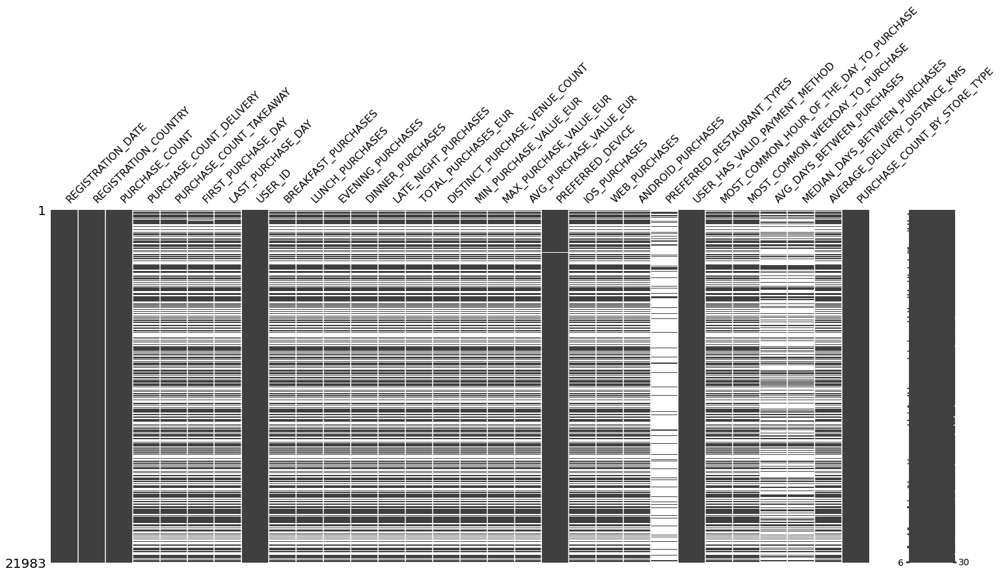

In [7]:
# It will be easy to visualize the missing data so i can make a better approach
# I use the library missingno for a visualization of missing data
import missingno
from missingno import matrix
matrix(df)

We have the PREFERRED_RESTAURANT_TYPES column with a lot of missing data.

Other features also have missing data but the reason is because PURCHASE_COUNT is 0. Due to users have not ordered.

My approach for solving the missing data are:
1. Keep the missing data related to PURCHASE_COUNT. Since it is a part of our USER_ID
2. Checking the PREFERRED_RESTAURANT_TYPES feature then decide to keep it or drop it.

In [8]:
# Checking the data in 'PREFERRED_RESTAURANT_TYPES' column
print(df['PREFERRED_RESTAURANT_TYPES'])

# Checking the number of value
print(df['PREFERRED_RESTAURANT_TYPES'].value_counts())

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
21978    NaN
21979    NaN
21980    NaN
21981    NaN
21982    NaN
Name: PREFERRED_RESTAURANT_TYPES, Length: 21983, dtype: object
[\n  "american"\n]                                                             658
[\n  "japanese"\n]                                                             367
[\n  "italian"\n]                                                              345
[\n  "mexican"\n]                                                              175
[\n  "american",\n  "italian"\n]                                               131
                                                                              ... 
[\n  "italian",\n  "american",\n  "chinese",\n  "indian"\n]                      1
[\n  "american",\n  "japanese",\n  "italian",\n  "mexican",\n  "chinese"\n]      1
[\n  "american",\n  "japanese",\n  "italian",\n  "mexican"\n]                    1
[\n  "italian",\n  "indian",\n  "american",\n  

The 'PREFERRED_RESTAURANT_TYPES' column has a lot of missing data present as NaN, float type. The rest are present in string type like a list.

I do not transform to new columns since the element in list is different for each USER_ID. My decision is to remove the 'PREFERRED_RESTAURANT_TYPES' column

In [9]:
# drop the 'PREFERRED_RESTAURANT_TYPES' column
df = df.drop(columns=['PREFERRED_RESTAURANT_TYPES'])

## Normalized 'STORE_TYPE' column

In [10]:
# The 'PURCHASE_COUNT_BY_STORE_TYPE' data are presented as string like dictionary for each USER_ID
df['PURCHASE_COUNT_BY_STORE_TYPE']

0        {\n  "General merchandise": 0,\n  "Grocery": 0...
1        {\n  "General merchandise": 0,\n  "Grocery": 0...
2        {\n  "General merchandise": 1,\n  "Grocery": 9...
3        {\n  "General merchandise": 0,\n  "Grocery": 0...
4        {\n  "General merchandise": 0,\n  "Grocery": 0...
                               ...                        
21978    {\n  "General merchandise": 0,\n  "Grocery": 0...
21979    {\n  "General merchandise": 0,\n  "Grocery": 0...
21980    {\n  "General merchandise": 0,\n  "Grocery": 0...
21981    {\n  "General merchandise": 0,\n  "Grocery": 0...
21982    {\n  "General merchandise": 0,\n  "Grocery": 0...
Name: PURCHASE_COUNT_BY_STORE_TYPE, Length: 21983, dtype: object

In [11]:
# Use json to load the column and transform it into new columns
df1 = df['PURCHASE_COUNT_BY_STORE_TYPE'].apply(json.loads)
for cat in ['General merchandise', 'Grocery', 'Pet supplies', 'Restaurant', 'Retail store']:
    df[cat] = df1.apply(lambda r: r[cat])

# Drop the PURCHASE_COUNT_BY_STORE_TYPE column
df = df.drop(columns=['PURCHASE_COUNT_BY_STORE_TYPE'])

In [11]:
df.head()

,REGISTRATION_DATE,REGISTRATION_COUNTRY,PURCHASE_COUNT,PURCHASE_COUNT_DELIVERY,PURCHASE_COUNT_TAKEAWAY,FIRST_PURCHASE_DAY,LAST_PURCHASE_DAY,USER_ID,BREAKFAST_PURCHASES,LUNCH_PURCHASES,...,MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE,MOST_COMMON_WEEKDAY_TO_PURCHASE,AVG_DAYS_BETWEEN_PURCHASES,MEDIAN_DAYS_BETWEEN_PURCHASES,AVERAGE_DELIVERY_DISTANCE_KMS,General merchandise,Grocery,Pet supplies,Restaurant,Retail store
0,2019-09-01,DNK,0,NaN,NaN,NaT,NaT,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
1,2019-09-01,FIN,1,1.0,0.0,2020-09-02,2020-09-02,2,0.0,1.0,...,23.0,2.0,NaN,NaN,6.853,0,0,0,1,0
2,2019-09-01,DNK,19,19.0,0.0,2019-12-10,2020-05-25,3,0.0,4.0,...,21.0,2.0,9.0,3.0,6.559,1,9,0,9,0
3,2019-09-01,FIN,0,NaN,NaN,NaT,NaT,4,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
4,2019-09-01,GRC,0,NaN,NaN,NaT,NaT,5,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0


# Exploratory 

The purposes of this part are:
1. Getting myself to familiar with the data
2. Provide a background info to answer the main task which is finding the user segmentation

## Column-wise group

In [12]:
# Since the data set has many columns, to make it easy to follow, i will divide them into groups.
df.columns

Index(['REGISTRATION_DATE', 'REGISTRATION_COUNTRY', 'PURCHASE_COUNT',
       'PURCHASE_COUNT_DELIVERY', 'PURCHASE_COUNT_TAKEAWAY',
       'FIRST_PURCHASE_DAY', 'LAST_PURCHASE_DAY', 'USER_ID',
       'BREAKFAST_PURCHASES', 'LUNCH_PURCHASES', 'EVENING_PURCHASES',
       'DINNER_PURCHASES', 'LATE_NIGHT_PURCHASES', 'TOTAL_PURCHASES_EUR',
       'DISTINCT_PURCHASE_VENUE_COUNT', 'MIN_PURCHASE_VALUE_EUR',
       'MAX_PURCHASE_VALUE_EUR', 'AVG_PURCHASE_VALUE_EUR', 'PREFERRED_DEVICE',
       'IOS_PURCHASES', 'WEB_PURCHASES', 'ANDROID_PURCHASES',
       'USER_HAS_VALID_PAYMENT_METHOD',
       'MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE',
       'MOST_COMMON_WEEKDAY_TO_PURCHASE', 'AVG_DAYS_BETWEEN_PURCHASES',
       'MEDIAN_DAYS_BETWEEN_PURCHASES', 'AVERAGE_DELIVERY_DISTANCE_KMS',
       'General merchandise', 'Grocery', 'Pet supplies', 'Restaurant',
       'Retail store'],
      dtype='object')

After dividing columns into group, we have 7 groups with some columns in others

|REGISTRATION|PURCHASE_QUANTITY|MEAL_TYPE|PURCHASE_VALUE|PURCHASE_PLATFORM|PURCHASE_TIME|PURCHASE_VENUE|OTHER|
|---|---|---|---|---|---|---|---|
|REGISTRATION_DATE|PURCHASE_COUNT|BREAKFAST_PURCHASES|TOTAL_PURCHASES_EUR|IOS_PURCHASES|MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE|General merchandise|DISTINCT_PURCHASE_VENUE_COUNT|
|REGISTRATION_COUNTRY|PURCHASE_COUNT_DELIVERY|LUNCH_PURCHASES|MIN_PURCHASE_VALUE_EUR|WEB_PURCHASES|MOST_COMMON_WEEKDAY_TO_PURCHASE|Grocery|AVERAGE_DELIVERY_DISTANCE_KMS|
|USER_ID|PURCHASE_COUNT_TAKEAWAY|EVENING_PURCHASES|MAX_PURCHASE_VALUE_EUR|ANDROID_PURCHASES|AVG_DAYS_BETWEEN_PURCHASES|Pet supplies||
|FIRST_PURCHASE_DAY||DINNER_PURCHASES|AVG_PURCHASE_VALUE_EUR||MEDIAN_DAYS_BETWEEN_PURCHASES|Restaurant||
|||LATE_NIGHT_PURCHASES||||Retail store||

### Registration

In [13]:
df.set_index('REGISTRATION_DATE').resample('1D')['USER_ID'].count().iplot(kind='line',
                                                                          colorscale='pastel1',
                                                                          showgrid=False,
                                                                          title='USER REGISTRATION BY DAY IN SEP2020')

# registration rise starting from beginning of weekend and peak at beginning of a new week then gradully decreasing.

In [14]:
df.groupby('REGISTRATION_COUNTRY')['USER_ID'].count().iplot(kind='bar',
                                                                      colorscale='pastel2',
                                                                      showgrid=False,
                                                                      title='USER REGISTRATION BY COUNTRY IN SEP2020')

# Top 3 countries have largest user register are Finland, Denmark and Greece

In [15]:
# Create a new column that present days to first purchase
df['DAYS_TO_FIRST_PURCHASE'] = (df['FIRST_PURCHASE_DAY'] - df['REGISTRATION_DATE']).dt.days

df['DAYS_TO_FIRST_PURCHASE'].iplot(kind='hist',
                                   colorscale='pastel2',
                                   showgrid=False,
                                   title='DAYS_TO_FIRST_PURCHASE DISTRIBUTION')

# We can see that most of users made their first purchase within 0 to 4 days

### Purchase_Quantity

In [16]:
df[['PURCHASE_COUNT', 'PURCHASE_COUNT_DELIVERY', 'PURCHASE_COUNT_TAKEAWAY']].sum().iplot(kind='bar',
                                                                                         colorscale='pastel2',
                                                                                         showgrid=False,
                                                                                         title='PURCHASE QUANTITY')

# Delivery is the main type of purchase

In [17]:
df[['PURCHASE_COUNT', 'PURCHASE_COUNT_DELIVERY',
    'PURCHASE_COUNT_TAKEAWAY']].iplot(kind='box',
                                      boxpoints='outliers',
                                      orientation='h',
                                      title='PURCHASE QUANTITY DISTRIBUTION')

# the distribution of each column is highly positive skewed with a long right tail

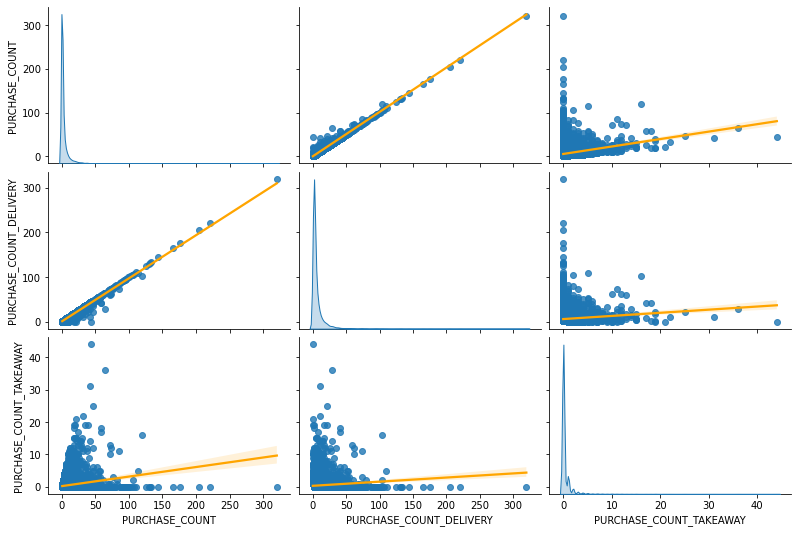

In [18]:
sns.pairplot(data=df[['PURCHASE_COUNT', 'PURCHASE_COUNT_DELIVERY', 'PURCHASE_COUNT_TAKEAWAY']],
             aspect=1.5,
             diag_kind='kde',
             kind="reg",
             plot_kws={'line_kws': {'color': 'orange'}},)

# No suprise that purchase count is strongly corrrelation with purchase delivery

### Purchase_Meal_Type

In [19]:
df[['DINNER_PURCHASES', 'LUNCH_PURCHASES', 'BREAKFAST_PURCHASES', 'EVENING_PURCHASES',
    'LATE_NIGHT_PURCHASES']].sum().iplot(kind='bar',
                                         colorscale='pastel2',
                                         showgrid=False,
                                         title='PURCHASE QUANTITY BY MEAL TYPE')

# Dinner & lunch dominate type of meal that are purchased

In [20]:
df[['BREAKFAST_PURCHASES', 'LUNCH_PURCHASES', 'EVENING_PURCHASES',
    'DINNER_PURCHASES', 'LATE_NIGHT_PURCHASES']].describe()

# Late night purchase column is empty. I will drop this column

,BREAKFAST_PURCHASES,LUNCH_PURCHASES,EVENING_PURCHASES,DINNER_PURCHASES,LATE_NIGHT_PURCHASES
count,12028.000000,12028.000000,12028.000000,12028.000000,12028.0
mean,0.193964,2.375042,0.493432,3.029016,0.0
std,1.104067,5.626178,1.827710,5.238209,0.0
min,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.000000,0.000000,0.000000,0.000000,0.0
50%,0.000000,1.000000,0.000000,1.000000,0.0
75%,0.000000,2.000000,0.000000,3.000000,0.0
max,52.000000,171.000000,71.000000,104.000000,0.0


In [21]:
df[['BREAKFAST_PURCHASES', 'LUNCH_PURCHASES',
    'EVENING_PURCHASES', 'DINNER_PURCHASES']].iplot(kind='box',
                                                    boxpoints='outliers',
                                                    orientation='h',
                                                    title='PURCHASE BY MEAL TYPE DISTRIBUTION')

# the meal type data in each column are also postive skewed with a long right tail

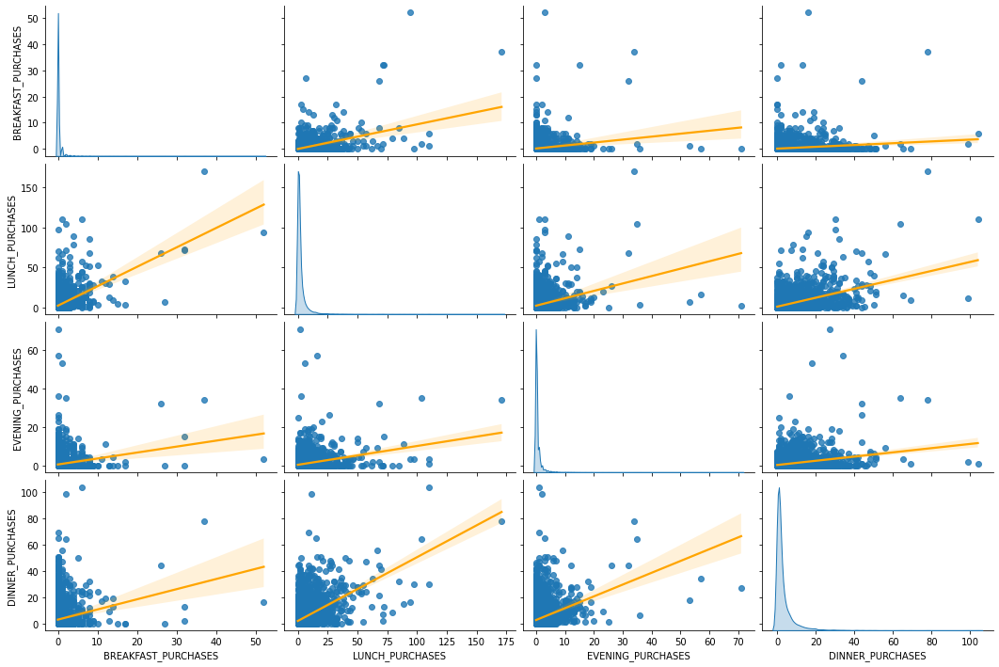

In [22]:
sns.pairplot(data=df[['BREAKFAST_PURCHASES', 'LUNCH_PURCHASES', 'EVENING_PURCHASES', 'DINNER_PURCHASES']],
             aspect=1.5,
             diag_kind='kde',
             kind="reg",
             plot_kws={'line_kws': {'color': 'orange'}})

# lunch & Dinner has a positive correlation
# lunch & breakfast also has a positive correlation
# It could be that users who order a type of meal will likely to order other type of meal as well

### Purchase_Value

In [22]:
df[['TOTAL_PURCHASES_EUR', 'MIN_PURCHASE_VALUE_EUR',
    'MAX_PURCHASE_VALUE_EUR', 'AVG_PURCHASE_VALUE_EUR']].mean().iplot(kind='bar',
                                                                      colorscale='pastel2',
                                                                      showgrid=False,
                                                                      title='PURCHASE VALUE')

# We know that the avg of a purchase is about 31.2 Euro
# The avg min is 24.4 Euro/ purchase
# The avg max is 42.2 Euro/ purchase

In [23]:
df[['TOTAL_PURCHASES_EUR', 'MIN_PURCHASE_VALUE_EUR',
    'MAX_PURCHASE_VALUE_EUR', 'AVG_PURCHASE_VALUE_EUR']].iplot(kind='box',
                                                               boxpoints='outliers',
                                                               orientation='h',
                                                               title='PURCHASE VALUE DISTRIBUTION')

# The data in each column are highly skewed with a long right tail

### Purchase_Platform

In [24]:
df[['IOS_PURCHASES', 'WEB_PURCHASES', 'ANDROID_PURCHASES']].sum().iplot(kind='bar',
                                                                        colorscale='pastel2',
                                                                        showgrid=False,
                                                                        title='PURCHASE BY FLATFORM')

# Ios is the top purchase platform, followed by android

In [25]:
df[['IOS_PURCHASES', 'WEB_PURCHASES', 'ANDROID_PURCHASES']].iplot(kind='box',
                                                                  boxpoints='outliers',
                                                                  orientation='h',
                                                                  title='PURCHASE BY PLATFORM DISTRIBUTION')

# Again, the data in each platform is also highly skewed with a right long tail

### Purchase_Time

In [26]:
df[['MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE', 'MOST_COMMON_WEEKDAY_TO_PURCHASE',
    'AVG_DAYS_BETWEEN_PURCHASES', 'MEDIAN_DAYS_BETWEEN_PURCHASES']].mean().iplot(kind='bar',
                                                                                 colorscale='pastel2',
                                                                                 showgrid=False,
                                                                                 title='PURCHASE_TIME')

# The most common hour in a day to purchase is 11.5h (at noon???)
# The most common weekday to purchase is 4 (Thursday???)
# The avg day between a purchase is 64.3 days
# The median between a purchase is 55.8 days

In [27]:
df[['MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE', 'MOST_COMMON_WEEKDAY_TO_PURCHASE',
    'AVG_DAYS_BETWEEN_PURCHASES', 'MEDIAN_DAYS_BETWEEN_PURCHASES']].iplot(kind='box',
                                                                          boxpoints='outliers',
                                                                          orientation='h',
                                                                          title='PURCHASE TIME DISTRIBUTION')

# the distribution of avg and median day, no suprise is skewed with a right long tail
# Common weekday & hour to purchase both have a normal distribution
# It is strange to have these info in a perfect normal distribution.

### Purchase_Venue

In [28]:
df[['General merchandise', 'Grocery', 'Pet supplies',
    'Restaurant', 'Retail store']].sum().iplot(kind='bar',
                                               colorscale='pastel2',
                                               showgrid=False,
                                               title='PURCHASE VENUE')

# Restaurant is dominate the purchase venue
# Grocery & Retail store are almost equal in volume but still far away from Restaurant
# This could be due to restaurant is the first venue to be introduced and other type of venue come later

In [29]:
df[['General merchandise', 'Grocery', 'Pet supplies',
    'Restaurant', 'Retail store']].iplot(kind='box',
                                         boxpoints='outliers',
                                         orientation='h',
                                         title='PURCHASE VENUE DISTRIBUTION')

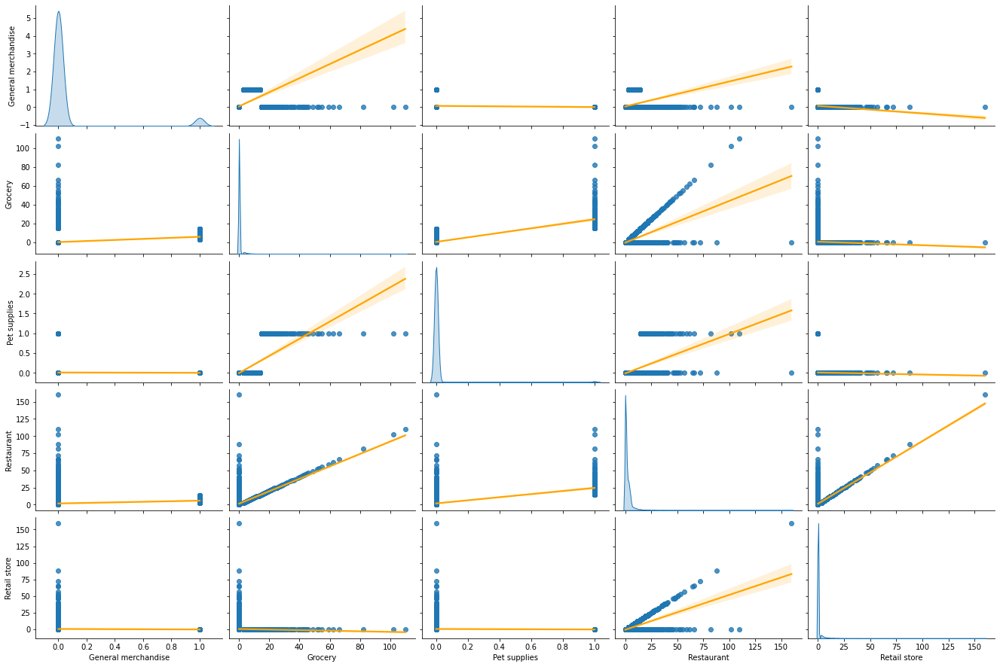

In [31]:
sns.pairplot(data=df[['General merchandise', 'Grocery', 'Pet supplies', 'Restaurant', 'Retail store']],
             aspect=1.5,
             diag_kind='kde',
             kind="reg",
             plot_kws={'line_kws': {'color': 'orange'}})

# Restaurant has a correlation with Grocery & Retail Store
# Grocery has a correlation with pet supplies

### Avg delivery distance & distinct venue


In [32]:
df['DISTINCT_PURCHASE_VENUE_COUNT'].describe()

# The avg distinct venue is about 3 per user

count    12028.000000
mean         3.319671
std          3.766418
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         71.000000
Name: DISTINCT_PURCHASE_VENUE_COUNT, dtype: float64

In [30]:
df['DISTINCT_PURCHASE_VENUE_COUNT'].iplot(kind='box',
                                          boxpoints='outliers',
                                          orientation='h',
                                          colorscale='pastel2',
                                          title='DISTINCT PURCHASE VENUE DISTRIBUTION')

# the data has a skewed distribution with a long right tail

In [34]:
df['AVERAGE_DELIVERY_DISTANCE_KMS'].describe()

# The avg delivery distance is about 6km
# the data seem will have a normal distribution

count    12028.000000
mean         5.961218
std          3.466263
min          0.002000
25%          2.950500
50%          5.928000
75%          8.978000
max         11.999000
Name: AVERAGE_DELIVERY_DISTANCE_KMS, dtype: float64

In [31]:
df['AVERAGE_DELIVERY_DISTANCE_KMS'].iplot(kind='box',
                                          boxpoints='outliers',
                                          orientation='h',
                                          colorscale='pastel2',
                                          title='AVERAGE DELIVERY DISTANCE KMS DISTRIBUTION')

# The AVERAGE_DELIVERY_DISTANCE_KMS actualy have a normal distribution
# Again, it is strange to have this info in a almost perfect normal distribution.

## Correlation table between features

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'FEATURE CORRELATION')

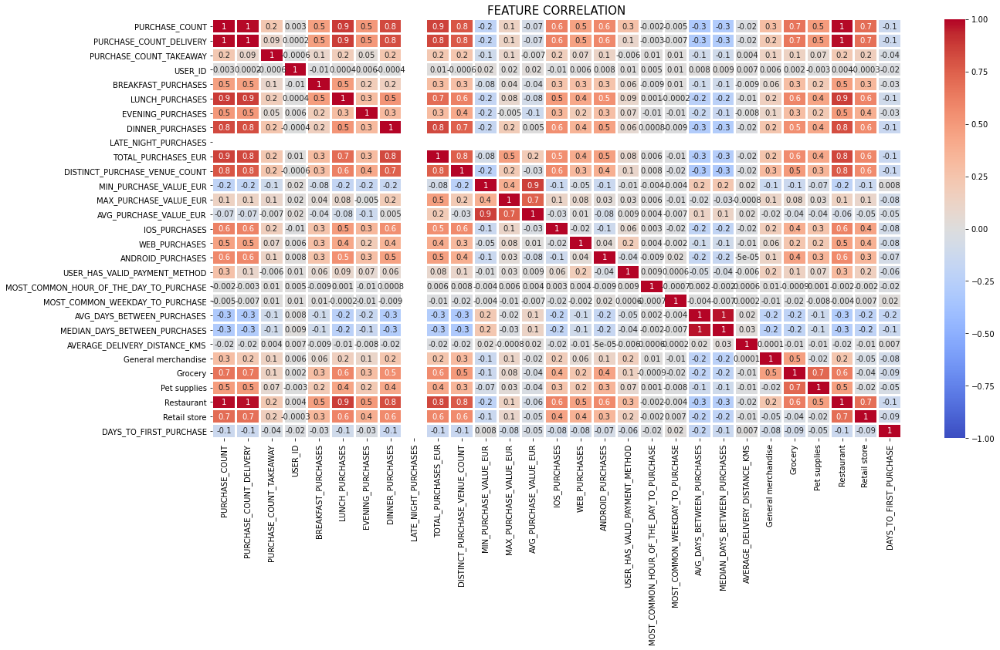

In [36]:
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True, fmt='.1g', vmin=-1,
            vmax=1, center=0, cmap='coolwarm', linewidths=2)

plt.title('FEATURE CORRELATION',
          fontdict={"fontsize": 15})

# Purchase count have a strong correlation with Lunch & Dinner purchase
# Purchase count have a strong correlation with Restaurant, Grocery & Retail
# Dinner & Lunch have a medium correlation with Ios & Android platform
# Restaurant, Grocery & Retail have a medium correlation with lunch & dinner purchase

## Row-wise group (by country)

### Registration by top countries during Sep2019

In [32]:
# Set Registration date as index for a timeline
df.set_index('REGISTRATION_DATE',inplace=True)

# Select only 3 main top countries into their own dataframe
Finland = df.loc[(df['REGISTRATION_COUNTRY'] == 'FIN')]
Denmark = df.loc[(df['REGISTRATION_COUNTRY'] == 'DNK')]
Greece = df.loc[(df['REGISTRATION_COUNTRY'] == 'GRC')]

# Resample into day and count number of user registration on that day
Finland = Finland.resample('1D')['USER_ID'].count().reset_index()
Denmark = Denmark.resample('1D')['USER_ID'].count().reset_index()
Greece = Greece.resample('1D')['USER_ID'].count().reset_index()

# Merged the data again so it will make into 1 chart for easy comparison
Merged_df = pd.merge(left=Finland, right=Denmark, on='REGISTRATION_DATE')
Merged_df = pd.merge(left=Merged_df, right=Greece, on='REGISTRATION_DATE')

# Rename the column to match the data content
Merged_df.rename(columns={'USER_ID_x': 'FIN_USER',
                 'USER_ID_y': 'DNK_USER', 'USER_ID': 'GRC_USER'}, inplace=True)

In [33]:
Merged_df.set_index('REGISTRATION_DATE').iplot(kind='line',
                                               colorscale='pastel2',
                                               showgrid=False,
                                               title='USER REGISTRATION BY TOP 3 COUNTRY BY DAY IN SEP2020')

# Finland show 2 peaks on user registration on 7th and 19 Sept compare to other countries.
# The registration pattern seem similar between 3 countries, except on 19th Sept

In [34]:
# Reset the df index
df.reset_index(inplace=True)

# Select the three countries Finland, Denmark, Greece since they has the most users
Top_Countries = df.loc[df['REGISTRATION_COUNTRY'].isin(['FIN', 'DNK', 'GRC'])]

In [35]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])['DAYS_TO_FIRST_PURCHASE'].mean().iplot(kind='bar',
                                                                                       barmode='group',
                                                                                       colorscale='pastel1',
                                                                                       showgrid=False,
                                                                                       title='DAYS TO FIRST PURCHASE BY TOP COUNTRIES')

# Greece has the highest days to first purchase
# Finland & Denmark both have almost same days to fisrt purchase at ~60days

### Number of purchase & no purchase by top countries

Text(0.5, 1.0, 'TOTAL USER REGISTRATION BY TOP COUNTRIES IN SEP2019')

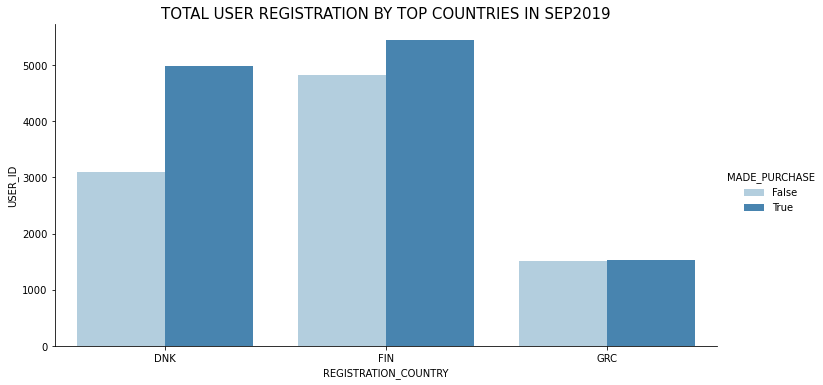

In [36]:
# Creating a new column of boolean for user who make a purchase and who have not
Top_Countries['MADE_PURCHASE'] = Top_Countries['PURCHASE_COUNT'] != 0

sns.catplot(x='REGISTRATION_COUNTRY',
            y='USER_ID',
            hue='MADE_PURCHASE',
            data=Top_Countries.groupby(['REGISTRATION_COUNTRY', 'MADE_PURCHASE'])['USER_ID'].count().reset_index(),
            kind='bar',
            legend=True,
            height=5,
            palette='Blues',
            aspect=2)

plt.title("TOTAL USER REGISTRATION BY TOP COUNTRIES IN SEP2019",
          fontdict={"fontsize": 15})

# Denmark has the lowest user who have not make an order.
# Almost a half of the users in Finland and Grecee have not make a first purchase yet.
# Out of these 3 countries, others are not provide many info

### Purchase_Meal_Type by top countries

In [37]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])[['BREAKFAST_PURCHASES',
                                                 'LUNCH_PURCHASES',
                                                 'EVENING_PURCHASES',
                                                 'DINNER_PURCHASES']].sum().iplot(kind='bar',
                                                                                  barmode='group',
                                                                                  colorscale='pastel1',
                                                                                  showgrid=False,
                                                                                  title='PURCHASE MEAL TYPE BY TOP COUNTRIES')
# Dannish users often have purchase dinner meal.
# Finnish users purchase dinner and lunch almost equally.
# Greece users purchase lunch more than dinner

### Total purchase price & quantity by top countries

In [38]:
# Make a new df with the needed columns
df2 = df[['REGISTRATION_COUNTRY', 'PURCHASE_COUNT', 'TOTAL_PURCHASES_EUR']]

# Groupby the data with registration country
df2 = df2.groupby(['REGISTRATION_COUNTRY']).sum().sort_values(
    by='TOTAL_PURCHASES_EUR', ascending=False).head(5)

In [39]:
df2.iplot(kind='bar',
          subplots=True,
          vertical_spacing=0.5,
          subplot_titles=True,
          showgrid=False,
          colorscale='pastel1',)

# Denmark has the highest total purchase value.
# Although Finland has more order but the total value is lower than Denmark
# As we knew that Dannish users often order dinner than lunch so it could be the reason

In [40]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])[['TOTAL_PURCHASES_EUR',
                                                 'MIN_PURCHASE_VALUE_EUR',
                                                 'MAX_PURCHASE_VALUE_EUR',
                                                 'AVG_PURCHASE_VALUE_EUR']].mean().iplot(kind='bar',
                                                                                         barmode='group',
                                                                                         colorscale='pastel1',
                                                                                         showgrid=False,
                                                                                         title='PURCHASE VALUE BY TOP COUNTRIES')

# Denmark rank 1 place in all type of purchase value
# Finland come at second place, closed to Denmark
# Greece come at the third place.

### Purchase flatform by top countries

In [41]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])[['IOS_PURCHASES',
                                                 'WEB_PURCHASES',
                                                 'ANDROID_PURCHASES']].sum().iplot(kind='bar',
                                                                                   barmode='group',
                                                                                   colorscale='pastel1',
                                                                                   showgrid=False,
                                                                                   title='PURCHASE FLATFROM BY TOP COUNTRIES')

# It is suprise that Finnish users use both of Ios and Android to purchase. And android is actually more prefered
# On the opposite, Dannish users prefer using Ios and it is dominated in Denmark.
# Greece has almost equal users perfer in both Ios and Android platform

### Purchase time by top countries

In [42]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])[['MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE',
                                                 'MOST_COMMON_WEEKDAY_TO_PURCHASE',
                                                 'AVG_DAYS_BETWEEN_PURCHASES',
                                                 'MEDIAN_DAYS_BETWEEN_PURCHASES']].mean().iplot(kind='bar',
                                                                                                barmode='group',
                                                                                                colorscale='pastel1',
                                                                                                showgrid=False,
                                                                                                title='PURCHASE TIME BY TOP COUNTRIES')

# There is no different in common hour and weekday to purchase between countries. This is strange.
# Greece user has the lowest avg days between purchase, after that is Finnish and Dannish.
# the median days between purchase follow the same pattern as it is strong correlation with avg day

### Purchase venue by top countries

In [43]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])[['General merchandise',
                                                 'Grocery',
                                                 'Pet supplies',
                                                 'Restaurant',
                                                 'Retail store']].sum().iplot(kind='bar',
                                                                              barmode='group',
                                                                              colorscale='pastel1',
                                                                              showgrid=False,
                                                                              title='PURCHASE VENUE BY TOP COUNTRIES')

# All 3 countries show a same pattern in each type of venue purchase
# 1st place is restaurant, 2nd place is almost equally between Grocery & Retail store

### Avg delivery distance & distinct venue by top countries

In [44]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])['AVERAGE_DELIVERY_DISTANCE_KMS'].mean().iplot(kind='bar',
                                                                                              barmode='group',
                                                                                              colorscale='pastel2',
                                                                                              showgrid=False,
                                                                                              title='AVG DELIVERY DISTANCE BY TOP COUNTRIES')

# There is no different in avg delivery distance between countries. It is strange

In [45]:
Top_Countries.groupby(['REGISTRATION_COUNTRY'])['DISTINCT_PURCHASE_VENUE_COUNT'].mean().iplot(kind='bar',
                                                                                              barmode='group',
                                                                                              colorscale='pastel2',
                                                                                              showgrid=False,
                                                                                              title='DISTINCT PURCHASE VENUE BY TOP COUNTRIES')
# The distinct purchase venue slightly different. Greece has slightly more distinct venue than Denmark and Finish

# Exploratory Summary

**1. REGISTRATION**
- Registration number increased from weekend and peaked at beginning of a new week then gradually decreased.
- Top 3 countries had largest registration users are Finland, Denmark and Greece
- The registration pattern seem similar between 3 countries.
- Denmark had the lowest users who have not make an order.
- Almost a half of the users in Finland and Greece have not make a first purchase yet.
- Most users made the first purchase within 0 to 4 days

**2. PURCHASE QUANTITY**
- Finland had more orders but the total value was lower than Denmark
- Denmark had the highest total purchase value.
- Delivery was the main type of purchase

**3. PURCHASE MEAL TYPE**
- Dinner & lunch dominated type of meal that are purchased
- Danish users often had purchase dinner meal.
- Finnish users purchased dinner and lunch almost equally.
- Greece users purchased lunch more than dinner

**4. PURCHASE PRICE BREAKDOWN**
- The avg of a purchase was about 31.2 Euro
- The avg min was 24.4 Euro/ purchase
- The avg max was 42.2 Euro/ purchase
- Denmark had the highest purchase price in all type

**5. PURCHASE PLATFORM**
- IOS was the top purchase platform, followed by android
- It was surprise that Finnish users used both of Ios and Android to purchase. Android was actually more preferred.
- In contrast, Danish users preferred using Ios and it was dominated in Denmark.
- Greece had almost equal users preferred in both Ios and Android platform

**6. PURCHASE TIME**
- The most common hour in a day to purchase was 11.5h
- The most common weekday to purchase was 4 
- The avg day between a purchase was 64.3 days
- The median between a purchase was 55.8 days
- There was no different in common hour and weekday to purchase between countries 
- Greece user had the lowest avg days between purchase, Finnish and Danish shared the same avg days.

**7. PURCHASE VENUE**
- Restaurant was dominate the purchase venue
- Grocery & Retail stores were almost equal in volume but still far away from Restaurant.
- All 3 countries shown a same pattern in each type of venue purchase. 1st place was restaurant, 2nd place was almost equally between Grocery & Retail store.

**8. PURCHASE AVG DISTANCE & DISTINCT VENUE**
- The avg distinct venue was about 3 per user.
- Greece had slightly more distinct venue than Denmark and Finish
- The avg delivery distance was about 6km. There was no different in avg delivery distance between countries 

**9. CORRELATION**
- Lunch & Dinner had a positive correlation (score = 0.5)
- Lunch & breakfast also had a positive correlation. (score = 0.5)
- Restaurant had a correlation with Grocery & Retail Store (score = 0.6)
- Grocery had a correlation with pet supplies (score = 0.7)
- Restaurant had a strong correlation with lunch & dinner purchase (score = 0.9)
- Grocery & Retail had a medium correlation with lunch & dinner (score = 0.6)

# User segmentation

## Criteria for a user segmentation

### Criteria 1: Relevant to Wolt business

Wolt business model is sharing economy that mean that the success of Wolt significantly depend on external stakeholders:
1. **Wolt's suppliers**: Restaurants, groceries, retails,...
2. **Wolt's logistic**: Couriers
3. **Wolts' users**: People who using wolt’s flatform to purchase items from wolt's suppliers

So these 3 stakeholders are doing great and sustainable, Wolt' business will growth

In order to find the indicator that could become a segmentation and help Wolt align with the success of these stakeholders. 
The target is to find one indicator, so I will follow the steps as below:
>1. Divide columns into each stakeholder based on the information that are relevant to them.
2. Select columns that are most relevant for all stakeholders.
3. If there is more than one column relevant to all stakeholders, i will move them to Criteria 2 & 3 and eliminate until only one left

||SUPPLIERS|COURIERS|USERS|
|---|---|---|---|
|REGISTRATION_COUNTRY|||X|
|PURCHASE_COUNT|X|X|X|
|PURCHASE_COUNT_DELIVERY|X|X|X|
|PURCHASE_COUNT_TAKEAWAY|X||X|
|FIRST_PURCHASE_DAY|X||X|
|LAST_PURCHASE_DAY|X||X|
|USER_ID|||X|
|BREAKFAST_PURCHASES|X||X|
|LUNCH_PURCHASES|X||X|
|EVENING_PURCHASES|X||X|
|DINNER_PURCHASES|X||X|
|TOTAL_PURCHASES_EUR|X||X|
|DISTINCT_PURCHASE_VENUE_COUNT|X||X|
|MIN_PURCHASE_VALUE_EUR|X||X|
|MAX_PURCHASE_VALUE_EUR|X||X|
|AVG_PURCHASE_VALUE_EUR|X||X|
|PREFERRED_DEVICE|X||X|
|IOS_PURCHASES|X||X|
|WEB_PURCHASES|X||X|
|ANDROID_PURCHASES|X||X
|USER_HAS_VALID_PAYMENT_METHOD|X||X|
|MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE|X|X|X|
|MOST_COMMON_WEEKDAY_TO_PURCHASE|X|X|X|
|AVG_DAYS_BETWEEN_PURCHASES|X|X|X|
|MEDIAN_DAYS_BETWEEN_PURCHASES|X|X|X|
|AVERAGE_DELIVERY_DISTANCE_KMS||X|X|
|General merchandise|X||X|
|Grocery|X||X|
|Pet supplies|X||X|
|Restaurant|X||X|
|Retail store|X||X|


Based on the table above, we have **6** columns that are relevant to all stakeholders:
>1. PURCHASE_COUNT
2. PURCHASE_COUNT_DELIVERY 	
3. MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE
4. MOST_COMMON_WEEKDAY_TO_PURCHASE
5. AVG_DAYS_BETWEEN_PURCHASES
6. MEDIAN_DAYS_BETWEEN_PURCHASES

Between PURCHASE_COUNT & PURCHASE_COUNT_DELIVERY, I select PURCHASE_COUNT because it included with takeaway option that benefit our users and suppliers.

MOST_COMMON_HOUR_OF_THE_DAY_TO_PURCHASE & MOST_COMMON_WEEKDAY_TO_PURCHASE also are interesting to know. For suppliers, they can be well prepare for that specific time. For couriers, they will be ready and target that working hours. However these data has a perfect normal distribution which do not give much any variable insight for segmentation.

Between AVG_DAYS_BETWEEN_PURCHASES & MEDIAN_DAYS_BETWEEN_PURCHASES, from the exploratory part we knew that the data of days between purchase are highly skewed. In this case, MEDIAN_DAYS_BETWEEN_PURCHASES is selected to reduce the affect of outliers.

Finally, we have two columns could be used to segment our users are **PURCHASE_COUNT** & **MEDIAN_DAYS_BETWEEN_PURCHASES**

### Criteria 2: Stable & long-term approach


When choosing an indicator for segmentation, it should be stable and giving a long-term approach for the company. The segmentation should not easy to change regulary by other factor like business activities, promotions, etc.

- PURCHASE_COUNT is great but it often use as a target (short-term). The problem is that the PURCHASE_COUNT will increase quickly when the business growth, to the infinity side. The segmentation based on it will have to change regularly and we hardly know an end goal.
- MEDIAN_DAYS_BETWEEN_PURCHASES provide the opposite approach. The final goal is to keep the median days as close to 0 as possible. The different is that we know the end goal here compare to PURCHASE_COUNT. So the segmentation will stay for a long period of time.
> **MEDIAN_DAYS_BETWEEN_PURCHASES** is selected for our user segmentation

### Criteria 3: Easy to communicate, access & measure

Although we have selected MEDIAN_DAYS_BETWEEN_PURCHASES to segment our users, there is an option to invert the data, make it into a frequency from 0 to 1

I decided to keep the data as they are (by day) because:
1. Easy to communicate a day time than a frequency between 0 to 1 to other stakeholders.
2. Easy to integrate with business targets & metrics. Many of them are based on day, month, year time
3. Easy to measure and track since other stakeholders can understand and integrate their activities together with it.

## Creating user segmentation

### Approach steps

<Figure size 1152x576 with 0 Axes>

<AxesSubplot:xlabel='MEDIAN_DAYS_BETWEEN_PURCHASES', ylabel='Count'>

Text(0.5, 1.0, 'MEDIAN DAYS BETWEEN PURCHASES HISTOGRAM')

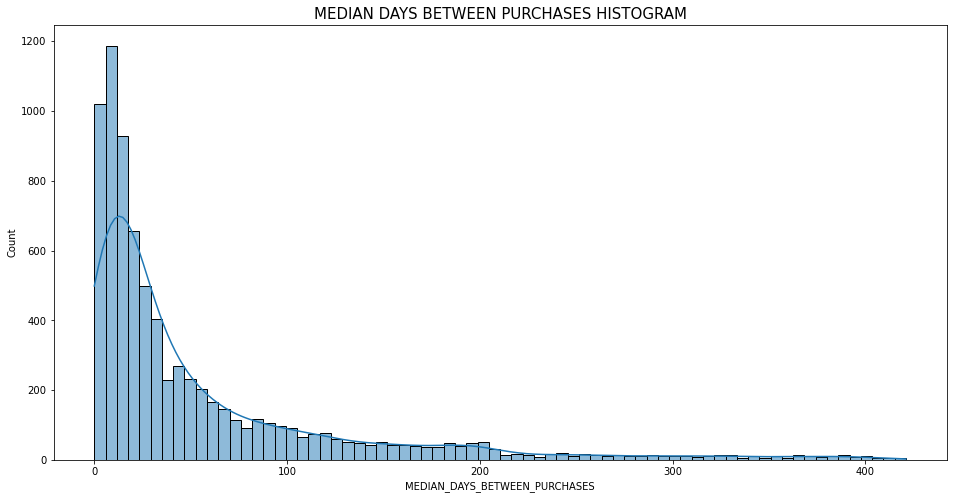

In [51]:
# Checking again the distribution of MEDIAN_DAYS_BETWEEN_PURCHASES
plt.figure(figsize=(16, 8))
sns.histplot(data=df, x='MEDIAN_DAYS_BETWEEN_PURCHASES', kde=True, bins='fd')
plt.title('MEDIAN DAYS BETWEEN PURCHASES HISTOGRAM',
          fontdict={"fontsize": 15})

In [46]:
# Checking again the boxplot & descriptive facts of MEDIAN_DAYS_BETWEEN_PURCHASES
df['MEDIAN_DAYS_BETWEEN_PURCHASES'].iplot(kind='box',
                                          boxpoints='outliers',
                                          orientation='h',
                                          colorscale='pastel2',
                                          title='MEDIAN DAYS BETWEEN PURCHASES BOXPLOT')
df['MEDIAN_DAYS_BETWEEN_PURCHASES'].describe()

count    7832.000000
mean       55.792135
std        74.963336
min         0.000000
25%        10.000000
50%        25.000000
75%        68.250000
max       421.000000
Name: MEDIAN_DAYS_BETWEEN_PURCHASES, dtype: float64

In [53]:
df['MEDIAN_DAYS_BETWEEN_PURCHASES'].describe()

count    7832.000000
mean       55.792135
std        74.963336
min         0.000000
25%        10.000000
50%        25.000000
75%        68.250000
max       421.000000
Name: MEDIAN_DAYS_BETWEEN_PURCHASES, dtype: float64

From the boxplot and describe(), we knew that the distribution of median_days is right skewed. Also we have the following info:
1. **Median**: 25 days
2. **Mean**: 55.7 days
3. **Standard deviation**: 75 days
4. **Min**: 0 day
5. **Max**: 421 day

We know that to have the data for median_days, an user will need to have at least 2 purchases. Based on this, we already can segment our first and second user group:
>**Segment 1**: Users who registered but have not purchased, so Purchase_count = 0\
>**Segment 2**: Users who have purchase_count = 1

Since the standard deviation of Median days is very large, i decide to reduce the outliers of the right tail with 1 standard deviation. This mean 75(std) + 55.7(mean) = 130.7 days as the point to remove outliers. However, i think this number is not so easy to remember, so i take the number 120 days instead as it is also 3 months time. 3 month is an appropriate and reasonable to call these users as rarely purchase users.
>**Segment 3**: User who has median_days_between_purchase > 120 days\

With the median at 25 days, again i take a day that close to that and easy to memorize is 30 days. This number will split our last two user groups:
>**Segment 4**: User who has median_days_between_purchase > 30 days & <= 120 days\
>**Segment 5**: User who has median_days_between_purchase >= 0 days & <= 30 days

In [48]:
# Create a list of our user segment
conditions = [(df['PURCHASE_COUNT'] == 0),
              (df['PURCHASE_COUNT'] == 1),
              (df['MEDIAN_DAYS_BETWEEN_PURCHASES'] > 120),
              (df['MEDIAN_DAYS_BETWEEN_PURCHASES'] > 30) & (df['MEDIAN_DAYS_BETWEEN_PURCHASES'] <= 120),
              (df['MEDIAN_DAYS_BETWEEN_PURCHASES'] >= 0) & (df['MEDIAN_DAYS_BETWEEN_PURCHASES'] <= 30)]

# Create a list of the label we want to assign for each segment
values = ['No_Purchase', 'One_Purchase', 'Rarely_Purchase',
          'Occasional_Purchase', 'Frequent_Purchase']

# Create a new column and assign values to it using our lists as arguments
df['USER_SEGMENT'] = np.select(conditions, values)

In [49]:
df.USER_SEGMENT.value_counts()

# There are 17 users that do not belong to any group.

No_Purchase            9955
Frequent_Purchase      4359
One_Purchase           4179
Occasional_Purchase    2379
Rarely_Purchase        1094
0                        17
Name: USER_SEGMENT, dtype: int64

In [50]:
# Since the number of 17 users is small. I decide to remove them.
# However, i cannot drop them normally, so i use the opposite way by using loc to select the segmentation

df = df.loc[df['USER_SEGMENT'].isin(['No_Purchase', 'One_Purchase', 'Rarely_Purchase',
                                     'Occasional_Purchase', 'Frequent_Purchase'])]

### User segment

In [51]:
df.groupby(['USER_SEGMENT'])['USER_ID'].count().reset_index().iplot(kind='pie',
                                                                    labels='USER_SEGMENT',
                                                                    values='USER_ID',
                                                                    sort=True,
                                                                    pull=0.05,
                                                                    colorscale='pastel1',
                                                                    title='USER SEGMENTATION')

We have the user segmentation as follow:
1. **Frequent_Purchase** : ~20%
2. **Occational_Purchase**: ~11%
3. **Rarely_Purchase**: ~5%
4. **One_Purchase**: 19%
5. **No_Purchase**: ~45%

# Recommendation 

## Approach

**PURPOSE**: How to use the segmentation to reactivate different kinds of users for marketing team.

**ACTION**: We want to move users in other segments up until they become Frequent_Purchase users. My approach is groupby our user segment with their behavior (column-wise) to find differences in each group. After that i also combine with the findings in Exploratory Summary to give a recommendation.

**Groupby our user segments with their behavior to find differences**:

- Purchase delivery & takeaway quantity no different found, same pattern
- Purchase meal by type in quantity, no different found, same pattern
- Purchase price, no different found, same pattern
- Purchase flatform, no different found, same pattern
- Purchase time, no different found, same pattern
- Delivery distance, no different found, same pattern

The only notable differences are in **PURCHASE_VENUE**, **DISTINCT_VENUE** and **DAYS_TO_FIRST_PURCHASE** in each user group

In [52]:
df.groupby(['USER_SEGMENT'])[['General merchandise',
                              'Grocery',
                              'Pet supplies',
                              'Restaurant',
                              'Retail store']].sum().iplot(kind='bar',
                                                           colorscale='pastel1',
                                                           showgrid=False,
                                                           title='PURCHASE VENUE BY USER SEGMENT')

# We saw that One_Purchase & Rarely_Purchase users just only use restaurant services

In [53]:
df.groupby(['USER_SEGMENT'])['DISTINCT_PURCHASE_VENUE_COUNT'].mean().iplot(kind='bar',
                                                                           colorscale='pastel2',
                                                                           showgrid=False,
                                                                           title='DISTINCT PURCHASE VENUE BY USER SEGMENT')

# We saw that Frequent_Purchase users have the most distinct venue count, double the Occational_Purchase users.
# By this, we can assume that Frequent_Purchase users like experience different services.
# Other user groups seem to be loyal group. It is not very good for our suppliers overall.

In [54]:
df.groupby(['USER_SEGMENT'])['DAYS_TO_FIRST_PURCHASE'].mean().iplot(kind='bar',
                                                                    colorscale='pastel1',
                                                                    showgrid=False,
                                                                    title='DAYS_TO_FIRST_PURCHASE')

# Surprisingly that Rarely_Purchase users actualy have the lowest days to first purchase
# One_Purchase have the highest days to first purchase while Frequent & Occational users are in the middle of them.
# It is hard to have a clear reason behind this behavior. 
# It maybe that One_Purchase users do not have the need for the service, 1st purchase was driven by external factors.
# For Rarely_Purchase user we see the opposite, they may have a sudden need and take advatage of the service.

## Recommendation

1. **No Purchase users**:
- The data do not provide any info about this type users except where they registered. I do not have any recommendation for this group based on the current data. If there are data about app/web usage of them, we may find out something.
2. **One & Rarely Purchase**: 
- Focus on introducing the service of grocery and retail for them to try out. 
- Recommend different shops in the same categories they purchased before.
- Recommend also other meal types like lunch & breakfast.
- For One_Purchase users, it is not much info about why they only purchase one time, we only know they have the longest day to make purchase. Customer feedback may help.

3. **Occasional Purchase**:
- Focus on recommending distinct restaurants, groceries, retail shops as well as variable meal types to them.

4. **Frequent Purchase**:
- It is important to maintain and keep them interesting by giving them first try out notification when there is new store, food and serive in their locations.

# Pros & Cons 

**PROS**:
- The segmentation are strongly relevant to Wolt’s business and all stakeholders are getting benefit from it.
- The segmentation is stable and can be use for a long-term approach
- The segmentation is easy to communicate, understand and measure 
- The segmentation in this dataset is at global level, not country level so it can be budget friendly.

**CONS**:
- Do not consider about the company (Wolt) situation and competitor movement. 
- Each country may have significant differences when the data are bigger. With this current dataset, we do not see much different by country. 
- It is not easy to pinpoint the exact motivations behind user behaviors, as they can vary greatly from person to person.